In [1]:
import mne
import pickle
import copy
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

with open("all_covert_reading.pkl", 'rb') as f:
    data_covert_reading = pickle.load(f)

with open("all_covert_producing.pkl", 'rb') as f:
    data_covert_producing = pickle.load(f)

In [430]:
# Functions
def concatenate_subject_epochs(BcomMEG_object) -> list:
    '''This function concatenates all of a subjects epochs, and then all of the subjects, into one array'''
    all_epochs = []
    for subject in BcomMEG_object.data:
        subject_data = []
        for epoch in BcomMEG_object.data[subject]:
            subject_data.append(BcomMEG_object.data[subject][epoch])
        all_epochs.append(mne.concatenate_epochs(subject_data))
    
    return all_epochs

def get_evoked_crops(epoched_data, full=False, tmin=None, tmax=None):
    '''Thist function crops all of the epochs in a subject array'''
    epoch_copy = copy.deepcopy(epoched_data)
    if full:
        full_crop = [epoch.average() for epoch in epoch_copy]
        del epoch_copy
        return full_crop 
    else:
        crop = [epoch.crop(tmin=tmin, tmax=tmax).average() for epoch in epoch_copy]
        del epoch_copy
        return crop


def get_top_k_channels_absolut_auc(evoked_data_crop, top_k=9, pre_averaged=False):
    '''This function takes the mne grand average of a cropped epoch array, and sums the absolute values of the cropped data.
    It then returns the top_k channels, i.e., the channels with the largest AUC, in the data'''
    
    # evoked_data_z = [mne.EvokedArray(zscore(i.data), i.info, tmin=i.tmin) for i in evoked_data_crop]
    if pre_averaged:
        absolute_auc = np.sum(abs(evoked_data_crop.data), axis=1)

        top_k_channels = np.argsort(absolute_auc)[-top_k:][::-1] #top is at the top now
    else:
        grand_average = mne.grand_average(evoked_data_crop)

        absolute_auc = np.sum(abs(grand_average.data), axis=1)

        top_k_channels = np.argsort(absolute_auc)[-top_k:][::-1] #top is at the top now

    return top_k_channels

def top_k_channel_names(top_k_channels, channel_name_list):
    '''This function returns the channel names based on the top_k_channel indexes'''
    return [channel_name_list[i] for i in top_k_channels]

In [3]:
covert_reading_epochs = concatenate_subject_epochs(data_covert_reading)

Not setting metadata
199 matching events found
No baseline correction applied
Not setting metadata
201 matching events found
No baseline correction applied
Not setting metadata
195 matching events found
No baseline correction applied
Not setting metadata
194 matching events found
No baseline correction applied
Not setting metadata
185 matching events found
No baseline correction applied
Not setting metadata
203 matching events found
No baseline correction applied
Not setting metadata
206 matching events found
No baseline correction applied
Not setting metadata
205 matching events found
No baseline correction applied
Not setting metadata
205 matching events found
No baseline correction applied
Not setting metadata
207 matching events found
No baseline correction applied
Not setting metadata
190 matching events found
No baseline correction applied
Not setting metadata
202 matching events found
No baseline correction applied
Not setting metadata
192 matching events found
No baseline corre

In [ ]:
# 2min 46s

reading_full_crop = get_evoked_crops(covert_reading_epochs, full=True)
reading_pre_crop = get_evoked_crops(covert_reading_epochs, tmin=-0.3, tmax=0.0)
reading_post_crop = get_evoked_crops(covert_reading_epochs, tmin=0.0, tmax=0.5)

In [5]:
channel_name_list = data_covert_reading.data['BCOM_01_2']['a_12'].info['ch_names']
top_k = 50

reading_full_top_k_channels = get_top_k_channels_absolut_auc(reading_full_crop, top_k=top_k)
reading_pre_crop_top_k_channels = get_top_k_channels_absolut_auc(reading_pre_crop, top_k=top_k)
reading_post_crop_top_k_channels = get_top_k_channels_absolut_auc(reading_post_crop, top_k=top_k)

reading_full_top_names = top_k_channel_names(reading_full_top_k_channels, channel_name_list=channel_name_list)
reading_pre_top_names = top_k_channel_names(reading_pre_crop_top_k_channels, channel_name_list=channel_name_list)
reading_post_top_names = top_k_channel_names(reading_post_crop_top_k_channels, channel_name_list=channel_name_list)

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


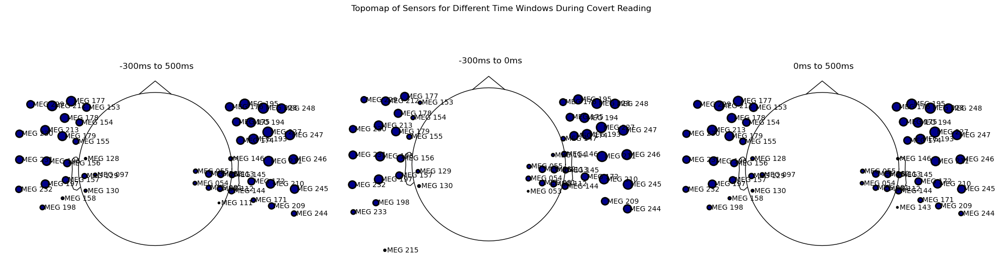

In [7]:
sample_copy1 = copy.deepcopy(reading_full_crop)
sample_copy2 = copy.deepcopy(reading_full_crop)
sample_copy3 = copy.deepcopy(reading_full_crop)

info_full = sample_copy1[0].pick(reading_full_top_names).info
info_pre = sample_copy2[0].pick(reading_pre_top_names).info
info_post = sample_copy3[0].pick(reading_post_top_names).info

fig, ax = plt.subplots(1, 3, figsize=(20,20))
mne.viz.plot_sensors(info_full, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[0])
mne.viz.plot_sensors(info_pre, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[1])
mne.viz.plot_sensors(info_post, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[2])
fig.suptitle('Topomap of Sensors for Different Time Windows During Covert Reading', y=0.65)
ax[0].set_title("-300ms to 500ms")
ax[1].set_title("-300ms to 0ms")
ax[2].set_title("0ms to 500ms")
plt.tight_layout()
plt.show()

In [8]:
covert_producing_epochs = concatenate_subject_epochs(data_covert_producing)

Not setting metadata
196 matching events found
No baseline correction applied
Not setting metadata
201 matching events found
No baseline correction applied
Not setting metadata
194 matching events found
No baseline correction applied
Not setting metadata
205 matching events found
No baseline correction applied
Not setting metadata
194 matching events found
No baseline correction applied
Not setting metadata
206 matching events found
No baseline correction applied
Not setting metadata
207 matching events found
No baseline correction applied
Not setting metadata
207 matching events found
No baseline correction applied
Not setting metadata
207 matching events found
No baseline correction applied
Not setting metadata
205 matching events found
No baseline correction applied
Not setting metadata
181 matching events found
No baseline correction applied
Not setting metadata
202 matching events found
No baseline correction applied
Not setting metadata
199 matching events found
No baseline corre

In [9]:
# 2min 48seconds

producing_full_crop = get_evoked_crops(covert_producing_epochs, full=True)
producing_pre_crop = get_evoked_crops(covert_producing_epochs, tmin=-0.3, tmax=0.0)
producing_post_crop = get_evoked_crops(covert_producing_epochs, tmin=0.0, tmax=0.5)

In [10]:
top_k = 9

producing_full_top_k_channels = get_top_k_channels_absolut_auc(producing_full_crop, top_k=top_k)
producing_pre_crop_top_k_channels = get_top_k_channels_absolut_auc(producing_pre_crop, top_k=top_k)
producing_post_crop_top_k_channels = get_top_k_channels_absolut_auc(producing_post_crop, top_k=top_k)

producing_full_top_names = top_k_channel_names(producing_full_top_k_channels, channel_name_list=channel_name_list)
producing_pre_top_names = top_k_channel_names(producing_pre_crop_top_k_channels, channel_name_list=channel_name_list)
producing_post_top_names = top_k_channel_names(producing_post_crop_top_k_channels, channel_name_list=channel_name_list)

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


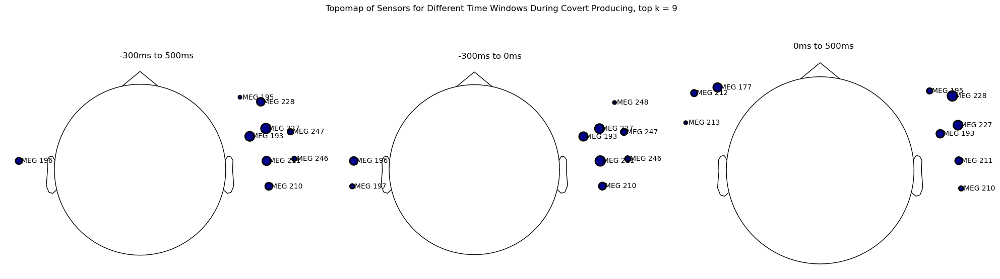

In [178]:
producing_sample_copy1 = copy.deepcopy(producing_full_crop)
producing_sample_copy2 = copy.deepcopy(producing_full_crop)
producing_sample_copy3 = copy.deepcopy(producing_full_crop)


producing_info_full = producing_sample_copy1[0].pick(producing_full_top_names).info
producing_info_pre = producing_sample_copy2[0].pick(producing_pre_top_names).info
producing_info_post = producing_sample_copy3[0].pick(producing_post_top_names).info

fig, ax = plt.subplots(1, 3, figsize=(20,20))
mne.viz.plot_sensors(producing_info_full, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[0])
mne.viz.plot_sensors(producing_info_pre, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[1])
mne.viz.plot_sensors(producing_info_post, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[2])
fig.suptitle(f'Topomap of Sensors for Different Time Windows During Covert Producing, top k = {top_k}', y=0.65)
ax[0].set_title("-300ms to 500ms")
ax[1].set_title("-300ms to 0ms")
ax[2].set_title("0ms to 500ms")
plt.tight_layout()
plt.show()
#54 #55 #52

In [ ]:
channel_name_list = data_covert_reading.data['BCOM_01_2']['a_12'].info['ch_names']
def track_sensor_sides(top_k, cropped_epochs, channel_name_list):
    num_lh_sensors = []
    num_rh_sensors = []

    for k in top_k:
        lhs = 0
        rhs = 0
        top_chans = top_k_channel_names(get_top_k_channels_absolut_auc(cropped_epochs, top_k=k), channel_name_list=channel_name_list)
        sample_copy = copy.deepcopy(cropped_epochs)
        info_full = sample_copy[0].pick(top_chans).info
        for ch in info_full['chs']:
            pos = ch['loc'][:3]
            if pos[0] < 0:
                lhs += 1
            elif pos[0] > 0:
                rhs += 1
        num_lh_sensors.append(lhs)
        num_rh_sensors.append(rhs)
        del sample_copy
    return num_lh_sensors, num_rh_sensors

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identify

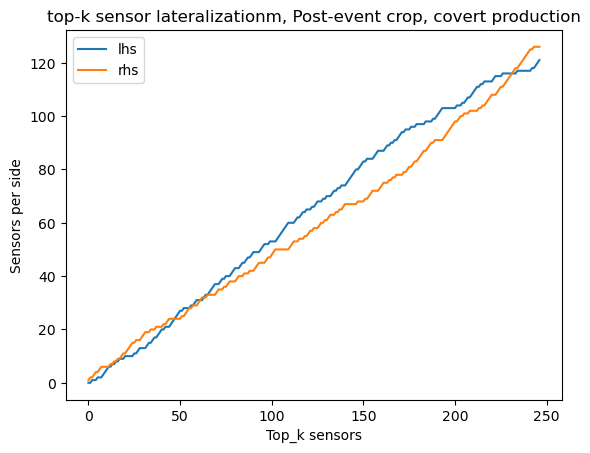

In [ ]:
lh_post, rh_post = track_sensor_sides(np.arange(1, 248), producing_post_crop, channel_name_list)

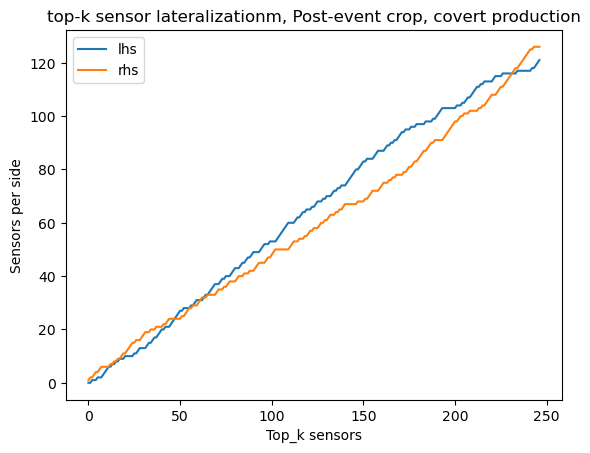

In [180]:
plt.plot(lh_post, label='lhs')
plt.plot(rh_post, label='rhs')
plt.xlabel('Top_k sensors')
plt.ylabel('Sensors per side')
plt.title('top-k sensor lateralizationm, Post-event crop, covert production')
plt.legend()

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identify

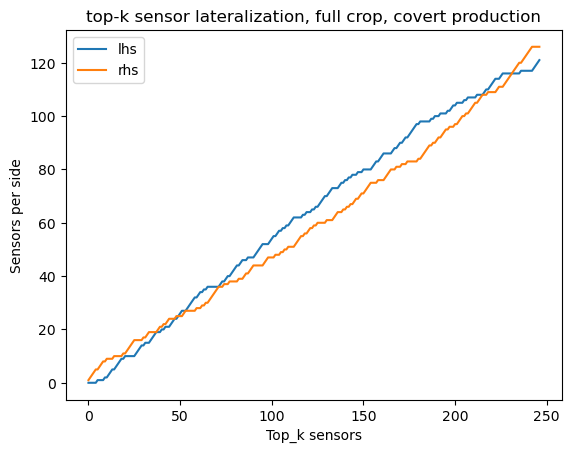

In [ ]:
lh_full, rh_full = track_sensor_sides(np.arange(1, 248), producing_full_crop, channel_name_list)

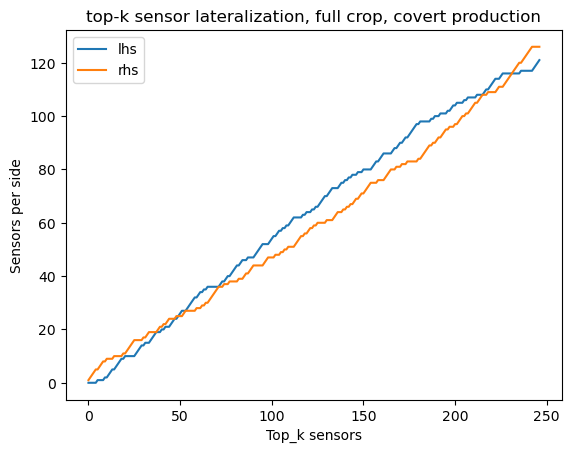

In [179]:
plt.plot(lh_full, label='lhs')
plt.plot(rh_full, label='rhs')
plt.xlabel('Top_k sensors')
plt.ylabel('Sensors per side')
plt.title('top-k sensor lateralization, full crop, covert production')
plt.legend()

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identify

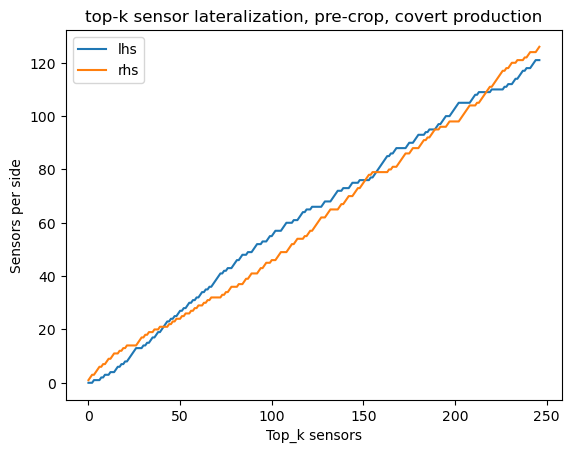

In [15]:
lh_pre, rh_pre = track_sensor_sides(np.arange(1, 248), producing_pre_crop, channel_name_list)
plt.plot(lh_pre, label='lhs')
plt.plot(rh_pre, label='rhs')
plt.xlabel('Top_k sensors')
plt.ylabel('Sensors per side')
plt.title('top-k sensor lateralization, pre-crop, covert production')
plt.legend()

In [16]:
read_lh_full, read_rh_full = track_sensor_sides(np.arange(1, 248), reading_full_crop, channel_name_list)

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identify

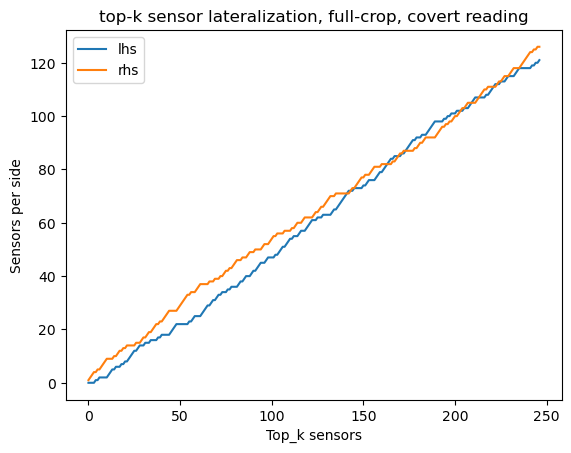

In [17]:
plt.plot(read_lh_full, label='lhs')
plt.plot(read_rh_full, label='rhs')
plt.xlabel('Top_k sensors')
plt.ylabel('Sensors per side')
plt.title('top-k sensor lateralization, full-crop, covert reading')
plt.legend()

In [40]:
vis_crop = get_evoked_crops(covert_producing_epochs, tmin=0.1, tmax=0.36)


Identifying common channels ...


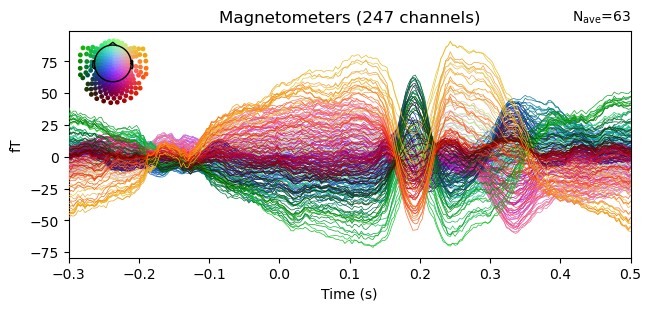

Identifying common channels ...


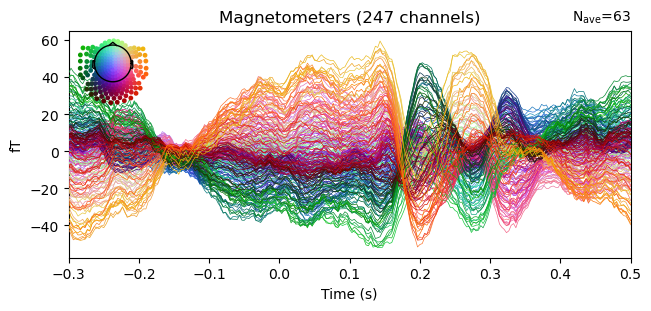

Identifying common channels ...


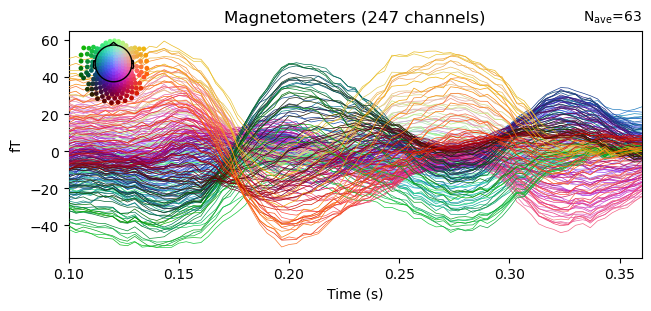

In [42]:
mne.grand_average(reading_full_crop).plot()
plt.show()
mne.grand_average(producing_full_crop).plot()
plt.show()
mne.grand_average(vis_crop).plot()
plt.show()

Identifying common channels ...


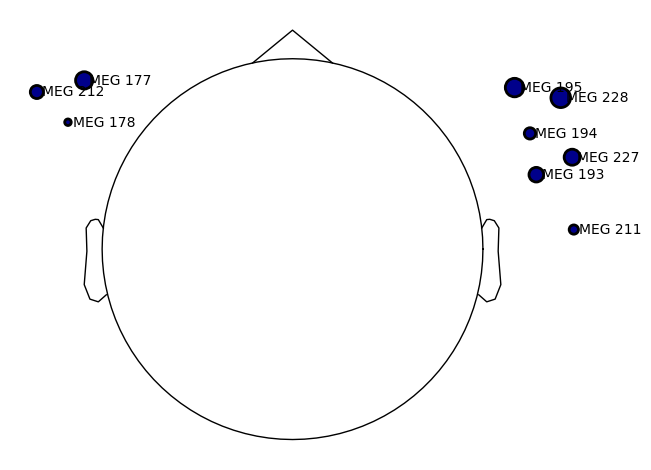

In [43]:
top_k=9
vis_chans = get_top_k_channels_absolut_auc(vis_crop, top_k=top_k)
top_vis = top_k_channel_names(vis_chans, channel_name_list=channel_name_list)
vis_sample_copy1 = copy.deepcopy(producing_full_crop)
vis_info_full = vis_sample_copy1[0].pick(top_vis).info
mne.viz.plot_sensors(vis_info_full, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k)
plt.show()

## Ok let's see what the PCA says maybe it will offer some insight

In [ ]:
# PCA functions
from sklearn.decomposition import PCA


def get_evoked_pca(cropped_data, n_components=None):
    grand_average = mne.grand_average(cropped_data)
    grand_average = grand_average.data.T
    if n_components is not None and n_components > grand_average.shape[0]:
        raise ValueError(f"Number of components cannot be greater than the number of data points ({grand_average.shape[0]})")
    elif n_components is None:
        print(f"Using as many components as possible: {grand_average.shape[0]}")
        n_components = grand_average.shape[0]
    pca = PCA(n_components=n_components)
    pca.fit(grand_average)
    return pca

def plot_explained_variance(pca_object, crop_name=None):
    explained_variance = pca_object.explained_variance_ratio_
    n_components = pca_object.n_components
    ev_pct = explained_variance * 100
    print(f"Explained vairance of the first {n_components} components: {sum(ev_pct[:n_components])} ")
    plt.plot(np.cumsum(ev_pct[:]), marker='o')
    plt.xlabel("Number of Components")
    plt.ylabel("Cumulative Explained Variance (%)")
    if crop_name is None:
        plt.title(f"PCA Explained Variance of top {n_components} Components")
    else: plt.title(f"PCA Explained Variance of top {n_components} Components, {crop_name}")
    plt.show()

def pca_loadings_to_sensors(pca_object, data_sample, crop_name=None, names_only=False):
    loadings = pca_object.components_
    n_components = pca_object.n_components
    weighted_loadings = np.abs(loadings) * pca_object.explained_variance_ratio_[:, np.newaxis]
    sensor_contributions = np.sum(weighted_loadings, axis=0)
    normalized_sensor_contributions = (sensor_contributions/np.sum(sensor_contributions)) * 100

    sample = copy.deepcopy(data_sample)
    sensor_names = sample[0].ch_names
    top_sensors_idx = np.argsort(normalized_sensor_contributions)[-int(n_components):][::-1]
    top_sensor_names = [sensor_names[i] for i in top_sensors_idx]

    pca_info_full = sample[0].pick(top_sensor_names).info

    if names_only:
        return top_sensor_names
    
    mne.viz.plot_sensors(pca_info_full, show=False, show_names=True)
    if crop_name:
        plt.title(f"Sensors with most contribution to Variance-PCA producing {crop_name}")
    
    del sample

def track_sensor_sides_pca(top_k, cropped_epochs):
    num_lh_sensors = []
    num_rh_sensors = []
    top_chans = pca_loadings_to_sensors(get_evoked_pca(cropped_data=cropped_epochs), cropped_epochs, names_only=True)

    for k in top_k:
        lhs = 0
        rhs = 0    
        sample_copy = copy.deepcopy(cropped_epochs)
        info_full = sample_copy[0].pick(top_chans[:k]).info
        for ch in info_full['chs']:
            pos = ch['loc'][:3]
            if pos[0] < 0:
                lhs += 1
            elif pos[0] > 0:
                rhs += 1
        num_lh_sensors.append(lhs)
        num_rh_sensors.append(rhs)

    del sample_copy
    
    return num_lh_sensors, num_rh_sensors

    

    
    

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Explained vairance of the first 16 components: 99.82880839324476 


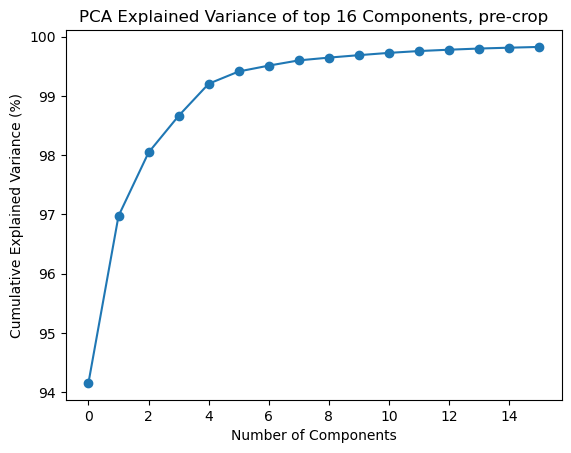

Explained vairance of the first 16 components: 99.8651160867257 


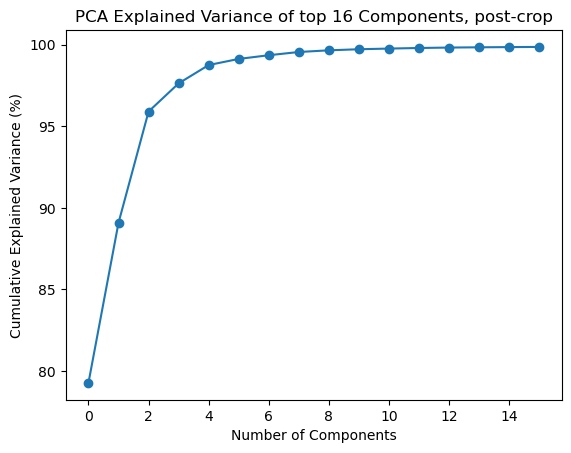

Explained vairance of the first 16 components: 99.80896484307254 


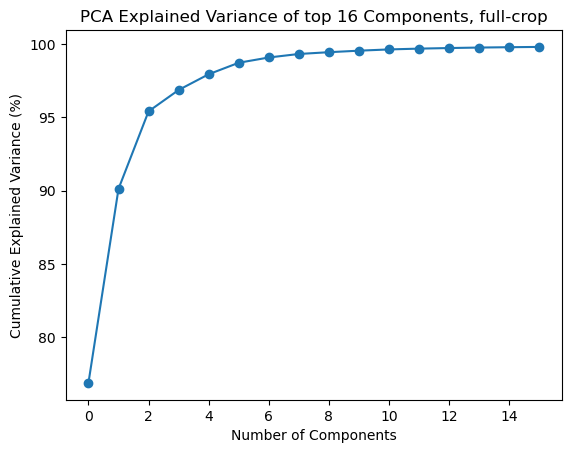

(None, None, None)

In [188]:
top_k = 16
producing_pre_crop_pca = get_evoked_pca(producing_pre_crop, top_k)
producing_post_crop_pca = get_evoked_pca(producing_post_crop, top_k)
producing_full_crop_pca = get_evoked_pca(producing_full_crop, top_k)

plot_explained_variance(producing_pre_crop_pca, "pre-crop"), plot_explained_variance(producing_post_crop_pca, "post-crop"), plot_explained_variance(producing_full_crop_pca, "full-crop")

['MEG 211',
 'MEG 210',
 'MEG 227',
 'MEG 196',
 'MEG 197',
 'MEG 228',
 'MEG 193',
 'MEG 246',
 'MEG 157',
 'MEG 245',
 'MEG 213',
 'MEG 156',
 'MEG 247',
 'MEG 179',
 'MEG 113',
 'MEG 172']

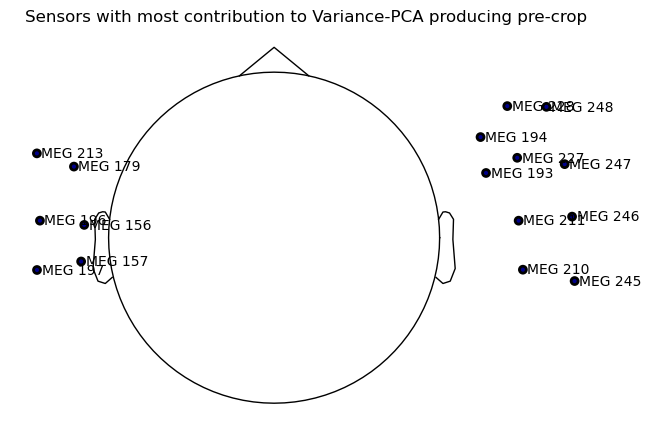

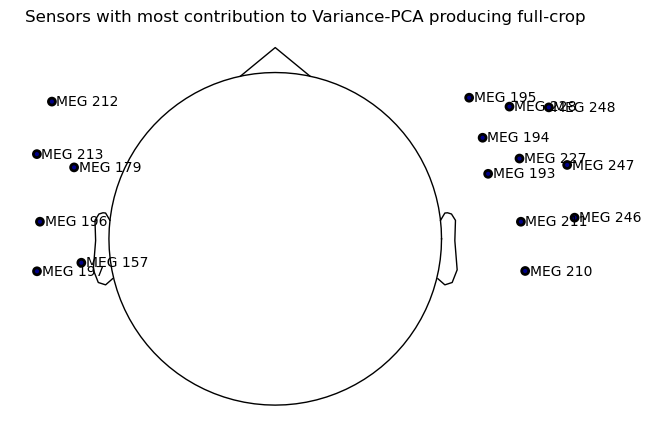

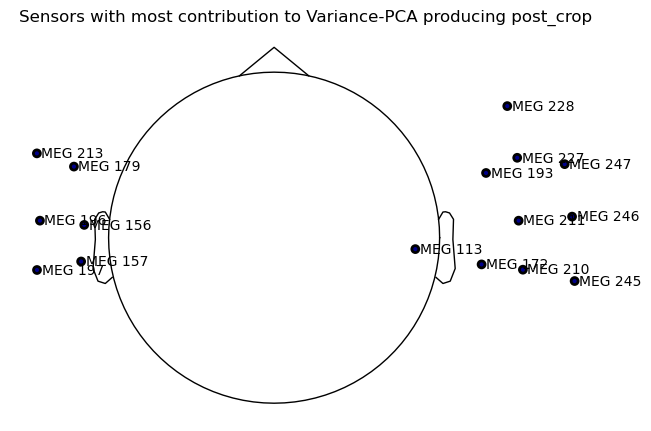

In [193]:
pca_loadings_to_sensors(producing_pre_crop_pca, producing_pre_crop, 'pre-crop')
pca_loadings_to_sensors(producing_full_crop_pca, producing_full_crop, 'full-crop')
pca_loadings_to_sensors(producing_post_crop_pca, producing_post_crop, 'post_crop')

In [209]:
lh, rh = track_sensor_sides_pca(np.arange(1, 151), producing_post_crop)

Identifying common channels ...
Using as many components as possible: 151


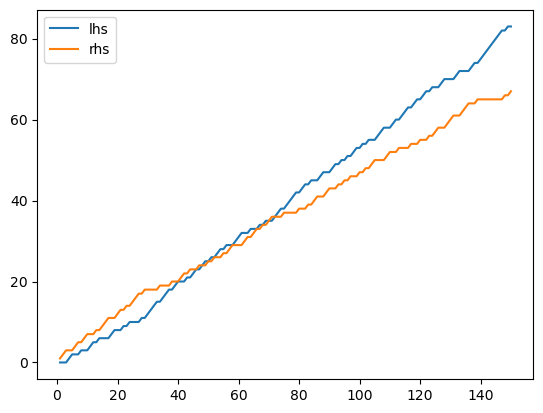

In [210]:
plt.plot(np.arange(1, 151), lh, label="lhs")
plt.plot(np.arange(1, 151), rh, label='rhs')
plt.legend()

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


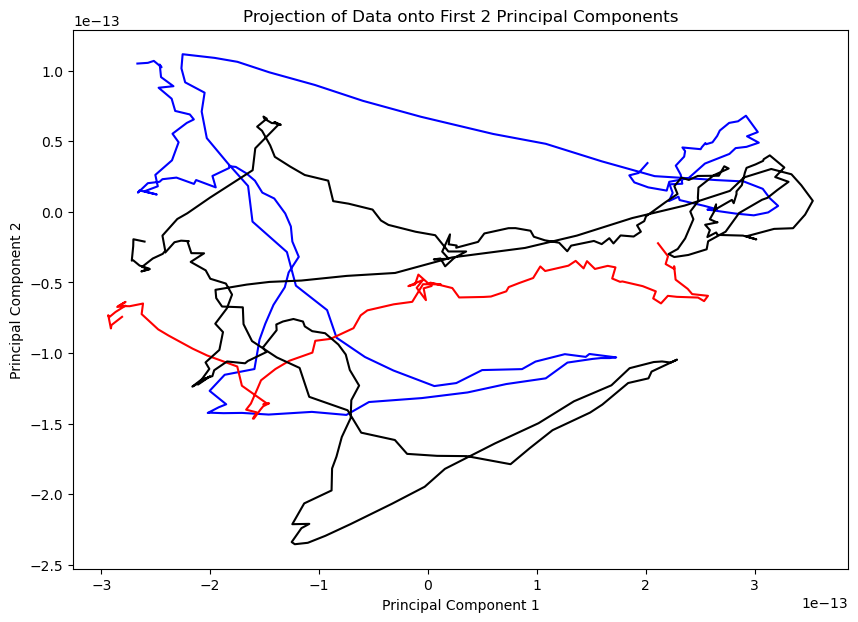

In [223]:
# Project the data onto the first 2 principal components
pca = get_evoked_pca(producing_post_crop, n_components=2)
pca2 = get_evoked_pca(producing_full_crop, n_components=2)
pca3 = get_evoked_pca(producing_pre_crop, n_components=2)
projected_data = pca.transform(mne.grand_average(producing_post_crop).data.T)
projected_data2 = pca2.transform(mne.grand_average(producing_pre_crop).data.T)
projected_data3 = pca3.transform(mne.grand_average(producing_full_crop).data.T)

# Plot the projected data
plt.figure(figsize=(10, 7))
plt.plot(projected_data[:, 0], projected_data[:, 1], c='b')
plt.plot(projected_data2[:, 0], projected_data2[:, 1], c='r')
plt.plot(projected_data3[:, 0], projected_data3[:, 1], c='black')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Projection of Data onto First 2 Principal Components')
plt.show()


### Ok let's also just look at the PCA of the different epochs, like when seperating them between vowels.

I think we can do this in terms of PCA,  but also in terms of coefficients. i.e., we can average over the epochs of all the subjects for the different conditions. Then, we can generate the full brain scalograms, and then subtract the coefficients condition wise.

In [277]:
# scalogram functions
import pywt

def scalogram_dereconstruction(data, wavelet='db4', level=7):
    # First decompose
    coefficients = pywt.wavedec(data, wavelet, level=level)
    coefficients[-1] = np.zeros_like(coefficients[-1]) #d1 #get rid of these two as in Dash et al 2020.
    coefficients[-2] = np.zeros_like(coefficients[-2]) #d2
    # Reconstruct
    reconstructed_signal = pywt.waverec(coefficients, wavelet)[:len(data)]
    return reconstructed_signal

def scalogram_cwt(processed_data, wavelet, B, C, sampling_rate, log_samples):
    wavelet = f'{wavelet}{B}-{C}'
    sampling_period = 1/sampling_rate
    frequencies = np.logspace(np.log10(1), np.log10(sampling_rate/2), log_samples)
    scales = pywt.central_frequency(wavelet=wavelet)/ (frequencies * sampling_period)
    coefficients, _ = pywt.cwt(data=processed_data, scales=scales, wavelet=wavelet, sampling_period=sampling_period)
    return coefficients

In [ ]:
available_labels = []
for subject in data_covert_producing.data:
    available_labels.extend(i for i in data_covert_producing.data[subject].keys())
available_labels = set(available_labels)

a_labels = [a for a in available_labels if 'a' in a]
e_labels = [e for e in available_labels if 'e' in e]
i_labels = [i for i in available_labels if 'i' in i]

In [262]:
a_epochs = []
e_epochs = []
i_epochs = []

for subject in data_covert_producing.data:
    for epoch in data_covert_producing.data[subject]:
        # print(data_covert_producing.data[subject][epoch])
        if epoch in a_labels:
            a_epochs.append(data_covert_producing.data[subject][epoch].average())
        elif epoch in e_labels:
            e_epochs.append(data_covert_producing.data[subject][epoch].average())
        elif epoch in i_labels:
            i_epochs.append(data_covert_producing.data[subject][epoch].average())

a_grand_average = mne.grand_average(a_epochs)
e_grand_average = mne.grand_average(e_epochs)
i_grand_average = mne.grand_average(i_epochs)

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


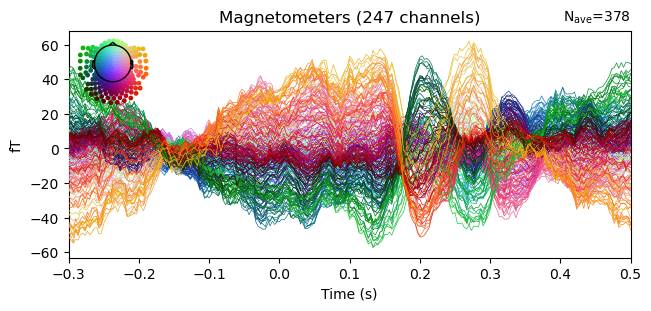

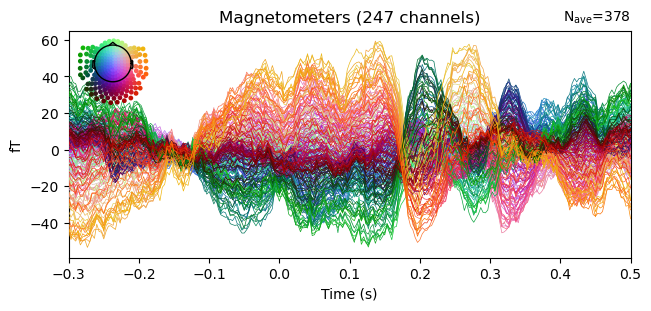

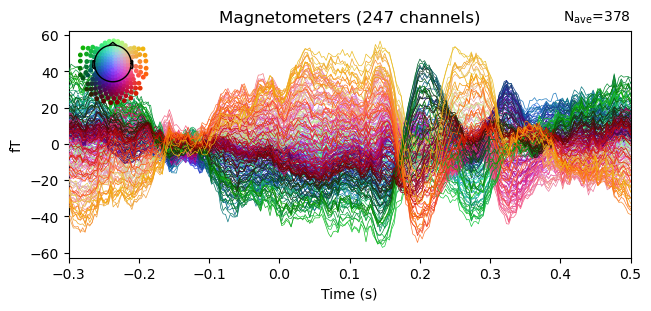

In [ ]:
i_grand_average.plot()
e_grand_average.plot()
a_grand_average.plot()
plt.show()

In [ ]:
# emtpy array to hold denoizing
processed_epochs = np.zeros_like(a_grand_average.data)

In [274]:
processed_epochs.shape

(247, 241)

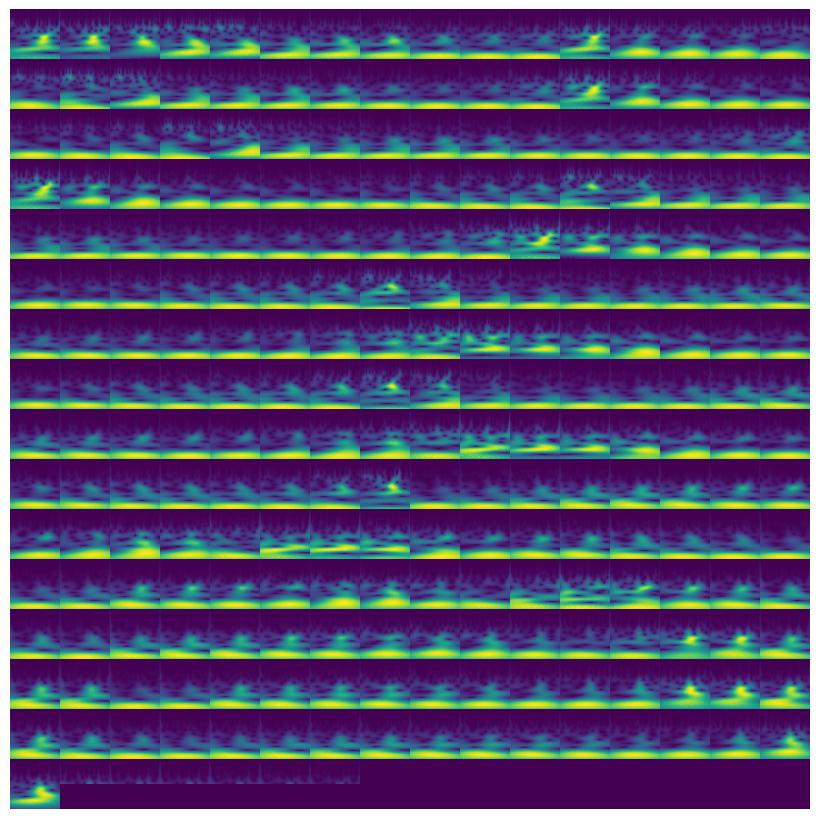

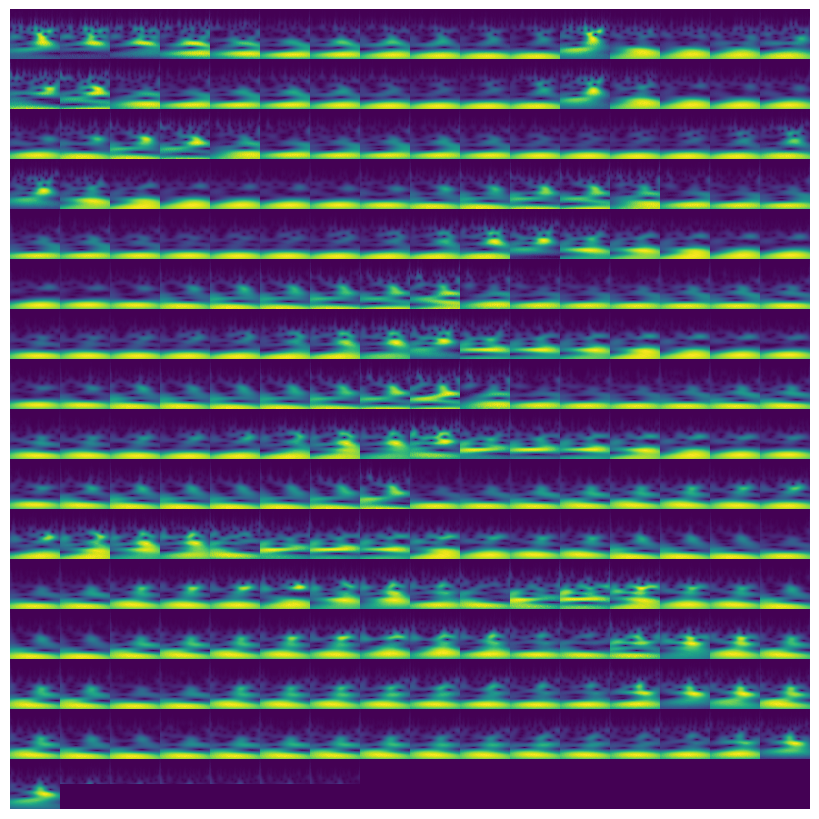

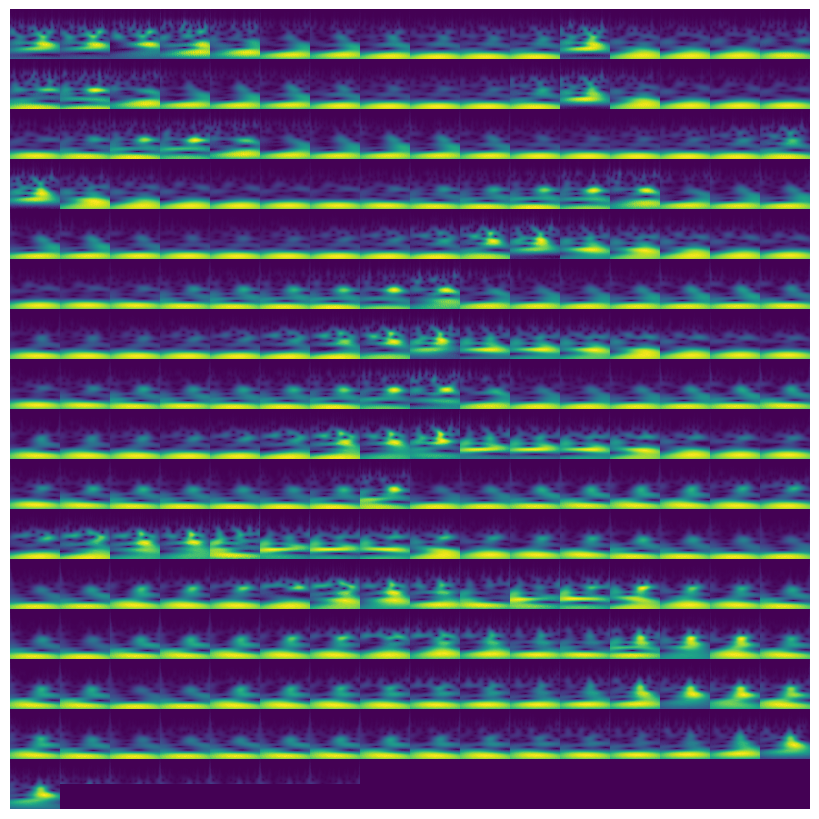

In [451]:
# grand average scalograms
all_averages = [a_grand_average, e_grand_average, i_grand_average]

for average in all_averages:
    fig, axes = plt.subplots(16, 16, figsize=(8, 8))    
    for channel in range(processed_epochs.shape[0]):
        r, c = divmod(channel, 16)
        signal = average.data[channel, :]
        processed_epochs[channel, :] = scalogram_dereconstruction(signal, wavelet='db4', level=5)
        coefficients = scalogram_cwt(processed_epochs[channel, :], B=1.0, C=1.0, wavelet='cmor', 
                                     sampling_rate=300, log_samples=100)
        axes[r, c].pcolormesh(np.abs(coefficients), cmap='viridis')
        axes[r, c].set_xticks([])
        axes[r, c].set_yticks([])

    for idx in range(processed_epochs.shape[1], 16*16):
        r, c = divmod(idx, 16)
        axes[r, c].pcolormesh(np.zeros((50, 241)), cmap='viridis')
        axes[r, c].set_xticks([])
        axes[r, c].set_yticks([])
    for ax in axes.flatten():
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['bottom'].set_visible(False)

    plt.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0, wspace=0)
    fig.patch.set_visible(False)
    plt.show()

In [400]:
def get_scalograms(averages):
    processed_array = np.zeros_like(averages[0].data)
    coefficients_array = np.zeros((len(averages), processed_array.shape[0], 100, 241))
    for i, average in enumerate(averages):
        for channel, data in enumerate(average.data):
            processed_epochs[channel, :] = scalogram_dereconstruction(data, wavelet='db4', level=5)
            coefficients = scalogram_cwt(processed_epochs[channel, :], B=1.0, C=1.0, wavelet='cmor', 
                                         sampling_rate=300, log_samples=100)
            coefficients_array[i, channel] = np.abs(coefficients)
    return coefficients_array

def normalize(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

In [ ]:
all_coefficients = get_scalograms([a_grand_average, e_grand_average, i_grand_average]) #10 seconds

Now we can look at the differences in scalograms

In [313]:
a_coefficients = all_coefficients[0]
e_coefficients = all_coefficients[1]
i_coefficients = all_coefficients[2]

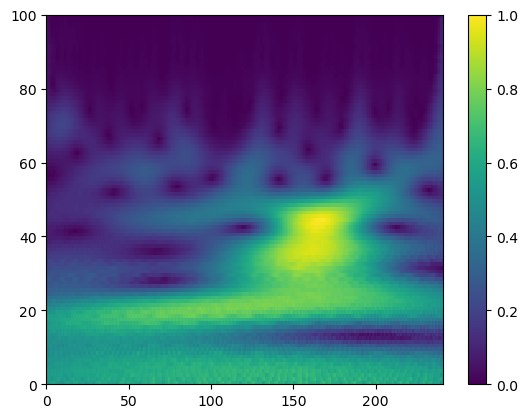

In [401]:
plt.pcolormesh(normalize(a_coefficients[0]))
plt.colorbar()

In [402]:
a_e = np.abs(normalize(a_coefficients) - normalize(e_coefficients))
a_i = np.abs(normalize(a_coefficients) - normalize(i_coefficients))
e_i = np.abs(normalize(e_coefficients) - normalize(i_coefficients))

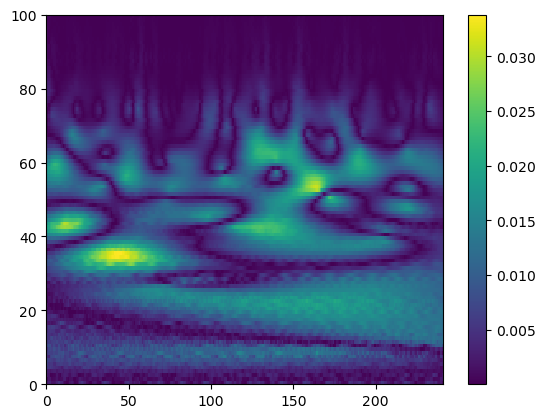

In [403]:
for channel, coefficients in enumerate(e_i):
    plt.pcolormesh(coefficients, cmap='viridis')
    plt.colorbar()
    break

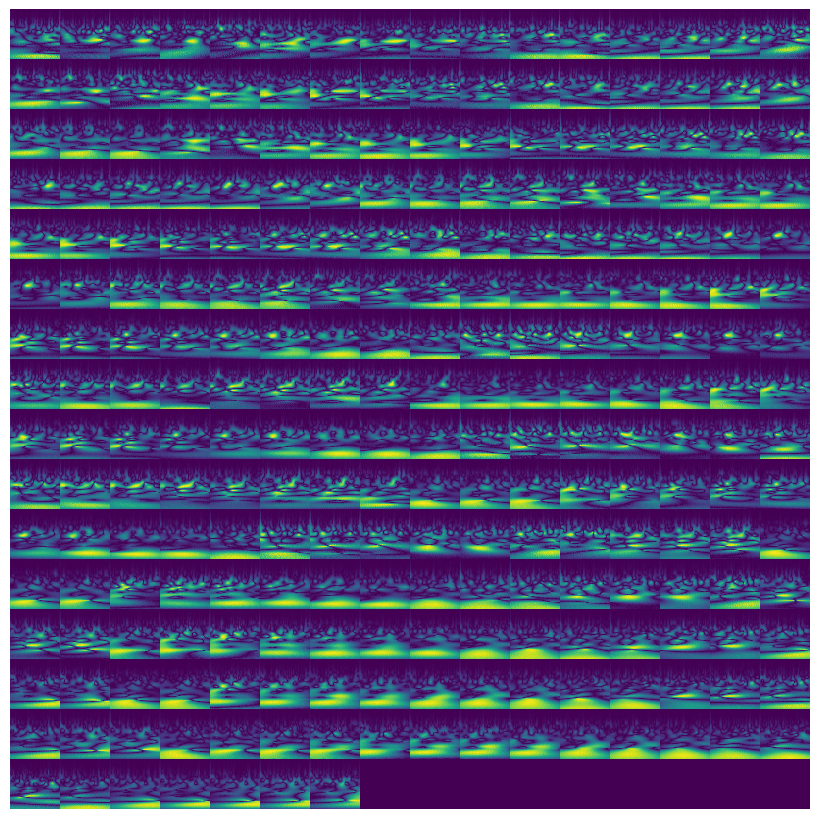

In [ ]:
# plotting the entire thing
fig, axes = plt.subplots(16, 16, figsize=(8, 8))
for channel, coefficients in enumerate(a_i):
    r, c = divmod(channel, 16)
    axes[r, c].pcolormesh(coefficients, cmap='viridis')
    axes[r, c].set_xticks([])
    axes[r, c].set_yticks([])
for idx in range(processed_epochs.shape[0], 16*16):
    r, c = divmod(idx, 16)
    axes[r, c].pcolormesh(np.zeros((50, 241)), cmap='viridis')
    axes[r, c].set_xticks([])
    axes[r, c].set_yticks([])
for ax in axes.flatten():
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
plt.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0, wspace=0)
fig.patch.set_visible(False)

But what we really want are the channels that maximize the difference between the categories

In [405]:
a_e_max_dif = np.array([np.sum(a_e[i, :, :]) for i in range(a_e.shape[0])])
a_i_max_dif = np.array([np.sum(a_i[i, :, :]) for i in range(a_i.shape[0])])
e_i_max_dif = np.array([np.sum(e_i[i, :, :]) for i in range(e_i.shape[0])])

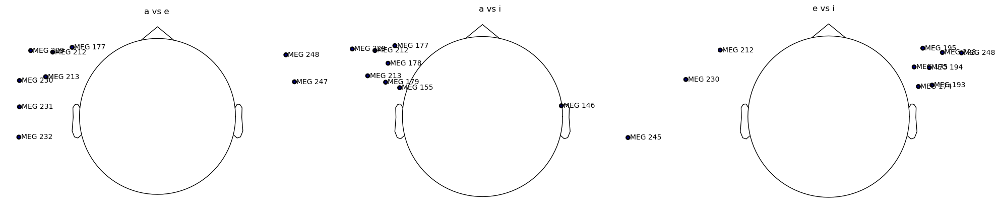

In [446]:
top_k = 9

a_e_top_k_indices = np.argsort(a_e_max_dif)[-top_k:][::-1]
a_i_top_k_indices = np.argsort(a_i_max_dif)[-top_k:][::-1]
e_i_top_k_indices = np.argsort(e_i_max_dif)[-top_k:][::-1]


fig, ax = plt.subplots(1, 3, figsize=(20,20))

a_e_sample = copy.deepcopy(producing_full_crop)
a_e_info = a_e_sample[0].pick(top_k_channel_names(a_e_top_k_indices, channel_name_list=channel_name_list)).info
mne.viz.plot_sensors(a_e_info, show=False, show_names=True, axes=ax[0])
del a_e_sample


a_i_sample = copy.deepcopy(producing_full_crop)
a_i_info = a_i_sample[0].pick(top_k_channel_names(a_i_top_k_indices, channel_name_list=channel_name_list)).info
mne.viz.plot_sensors(a_i_info, show=False, show_names=True, axes=ax[1])
del a_i_sample


e_i_sample = copy.deepcopy(producing_full_crop)
e_i_info = e_i_sample[0].pick(top_k_channel_names(e_i_top_k_indices, channel_name_list=channel_name_list)).info
mne.viz.plot_sensors(e_i_info, show=False, show_names=True, axes=ax[2])
del e_i_sample

ax[0].set_title("a vs e")
ax[1].set_title("a vs i")
ax[2].set_title("e vs i")

fig.tight_layout()
plt.show()

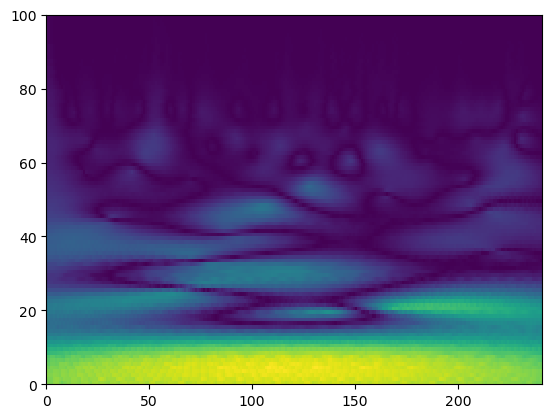

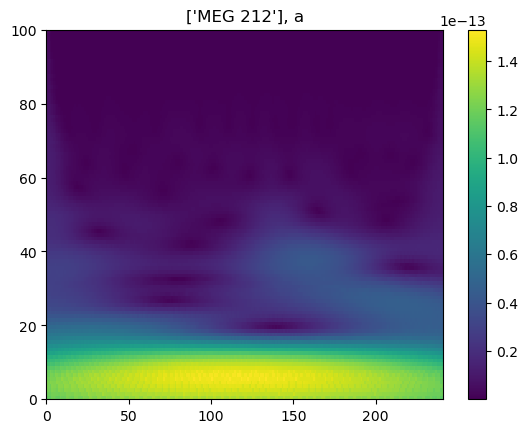

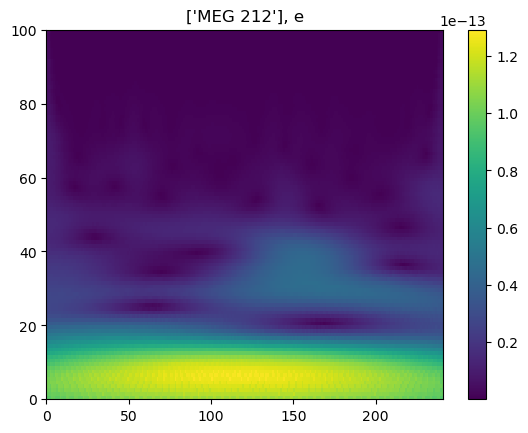

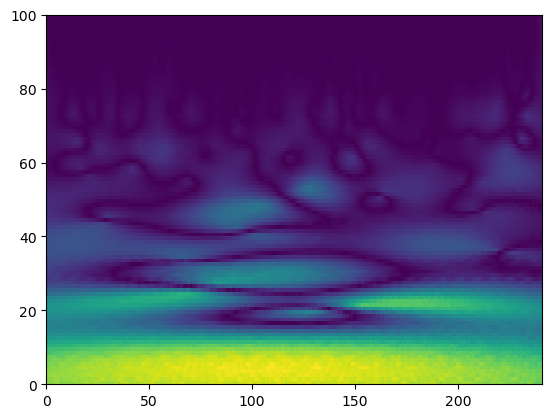

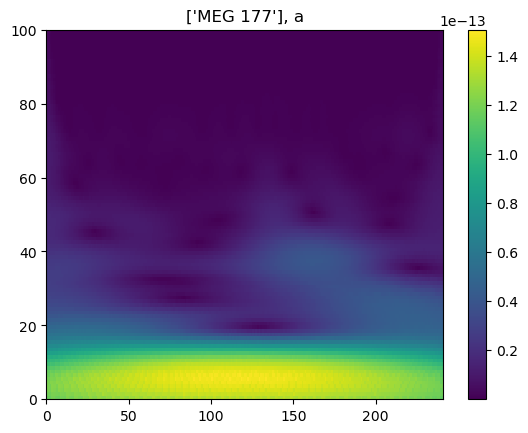

...

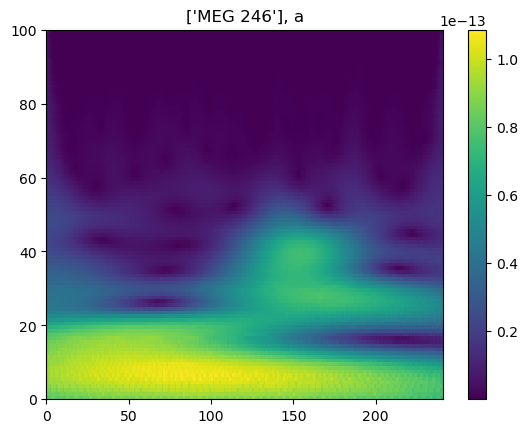

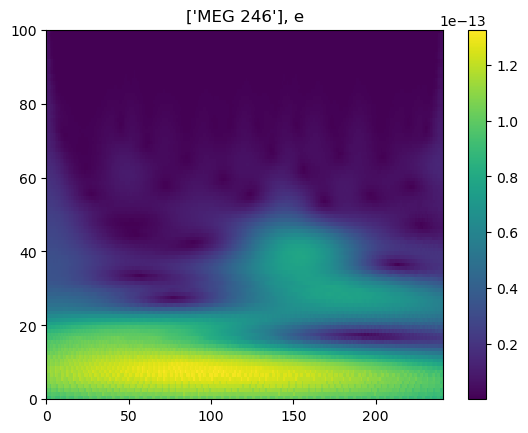

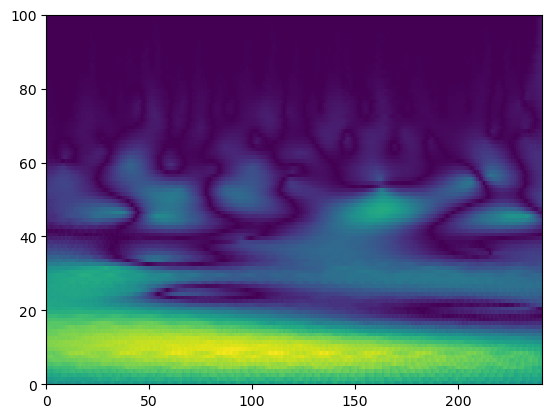

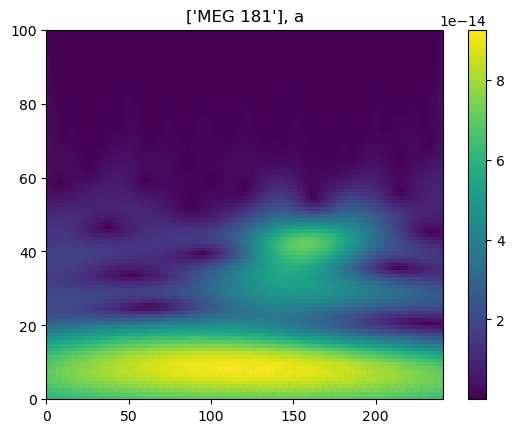

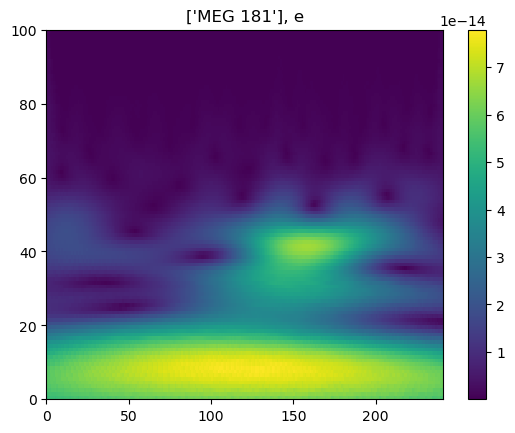

In [427]:
for index in a_e_top_k_indices:
    plt.pcolormesh(a_e[index])
    plt.show()
    plt.pcolormesh(a_coefficients[index])
    title = top_k_channel_names([index], channel_name_list=channel_name_list)
    plt.title(f"{title}, a")
    plt.colorbar()
    plt.show()
    plt.pcolormesh(e_coefficients[index])
    plt.title(f"{title}, e")
    plt.colorbar()
    plt.show()
    

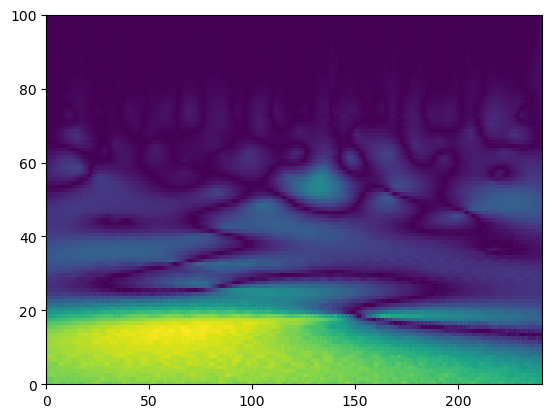

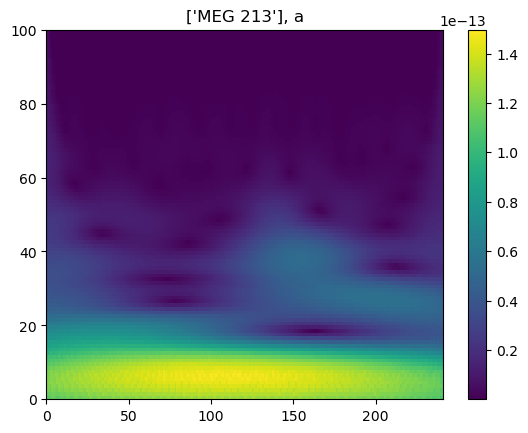

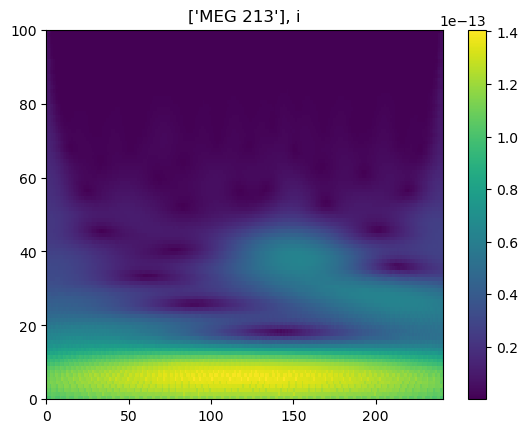

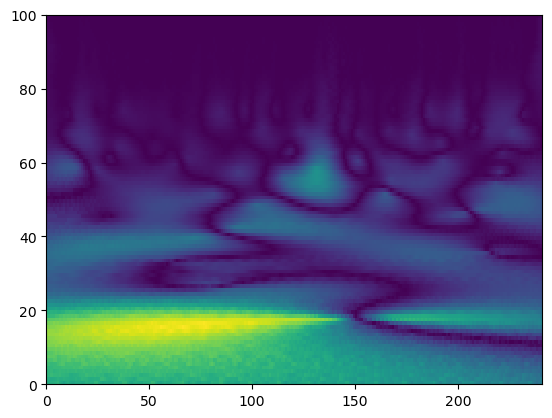

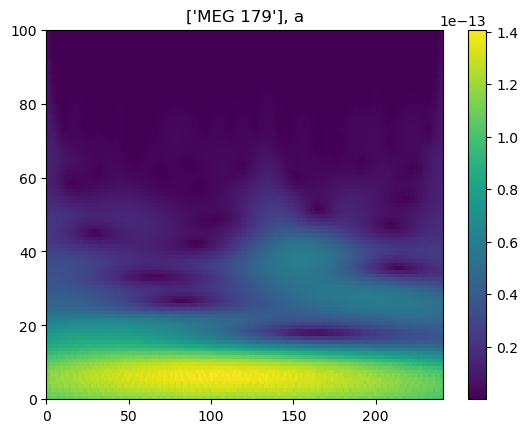

...

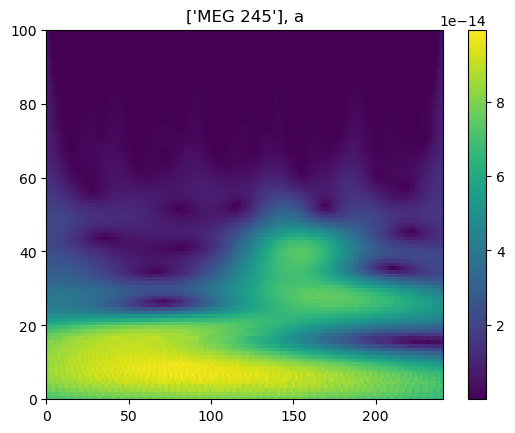

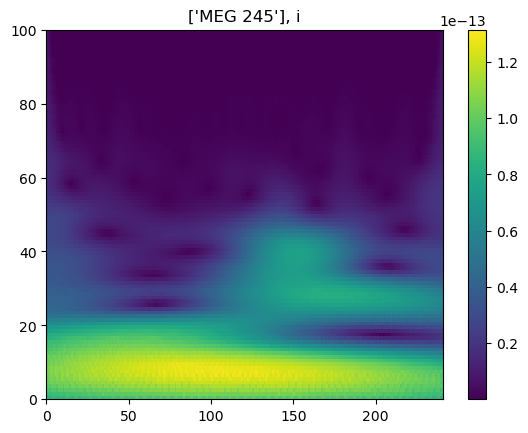

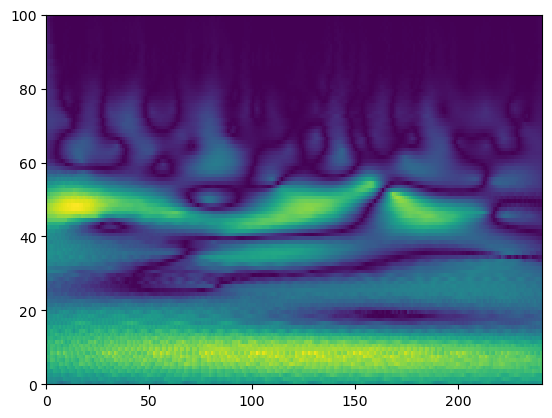

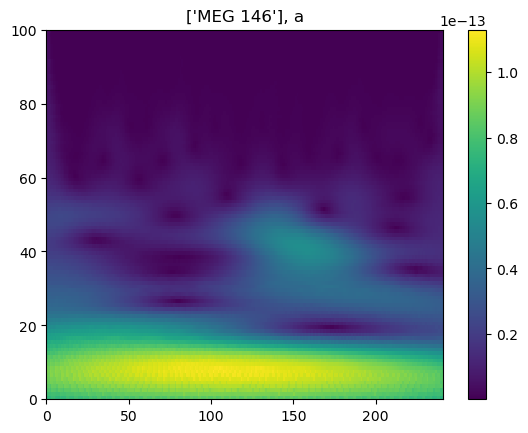

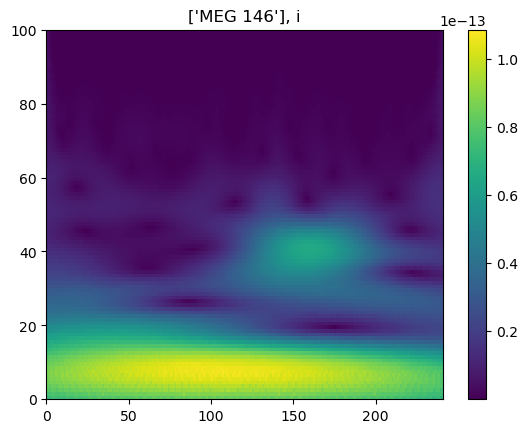

In [424]:
for index in a_i_top_k_indices:
    plt.pcolormesh(a_i[index])
    plt.show()
    plt.pcolormesh(a_coefficients[index])
    title = top_k_channel_names([index], channel_name_list=channel_name_list)
    plt.title(f"{title}, a")
    plt.colorbar()
    plt.show()
    plt.pcolormesh(i_coefficients[index])
    plt.title(f"{title}, i")
    plt.colorbar()
    plt.show()

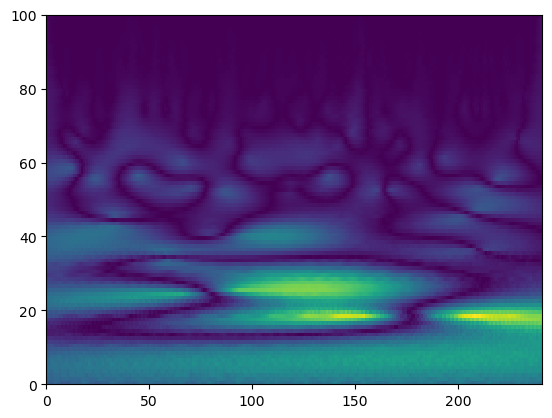

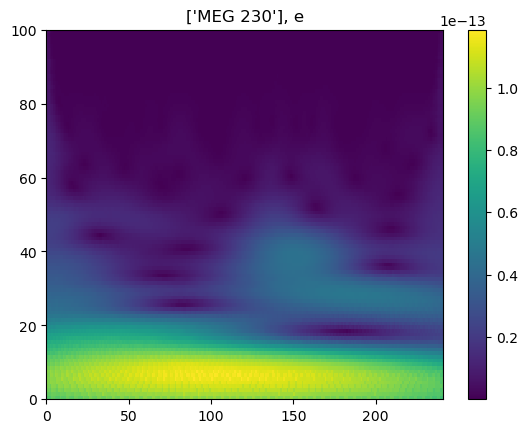

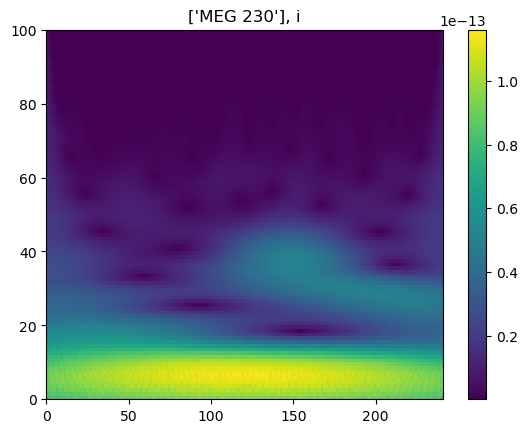

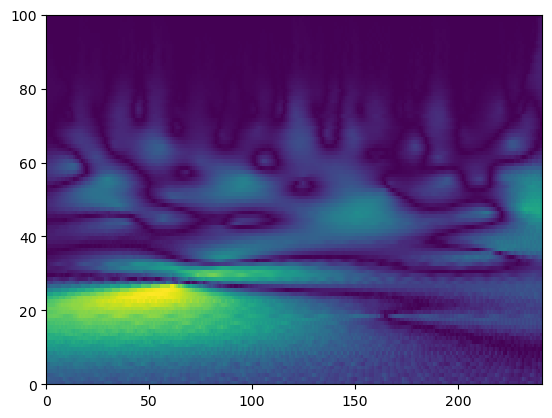

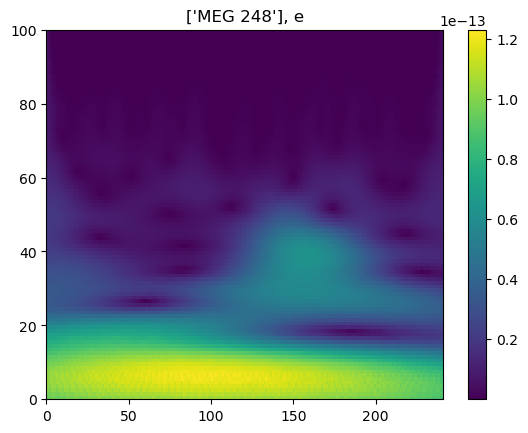

...

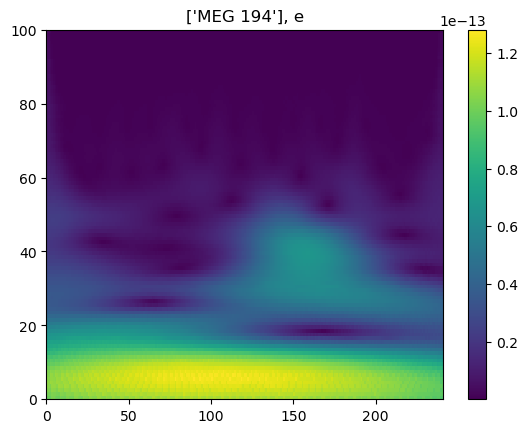

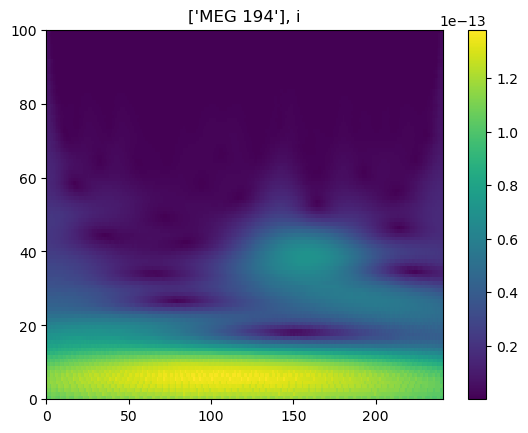

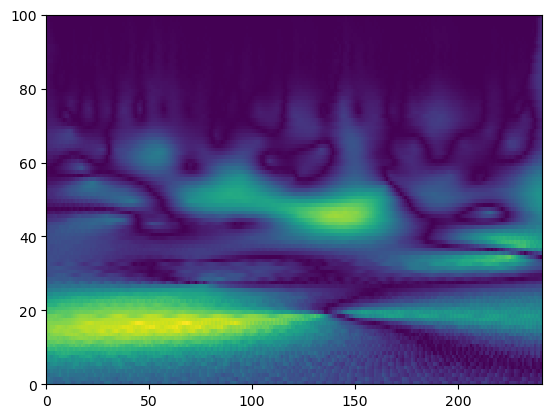

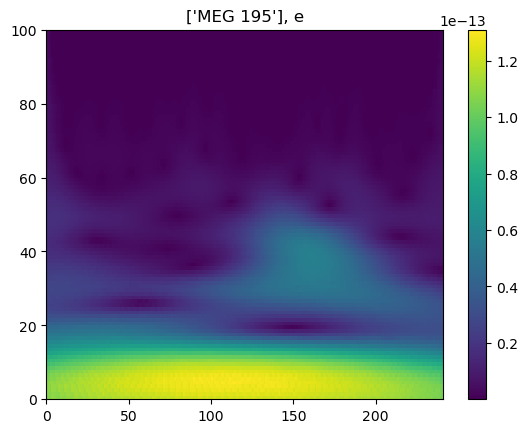

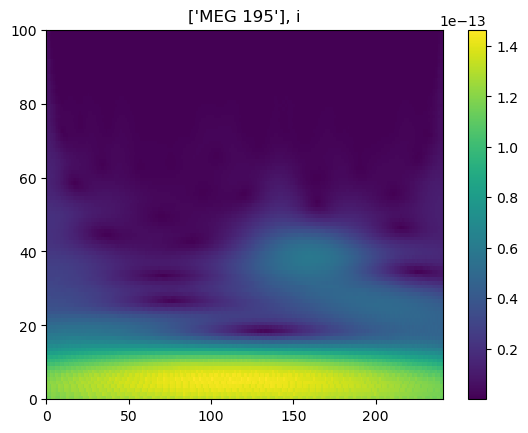

In [425]:
for index in e_i_top_k_indices:
    plt.pcolormesh(e_i[index])
    plt.show()
    plt.pcolormesh(a_coefficients[index])
    title = top_k_channel_names([index], channel_name_list=channel_name_list)
    plt.title(f"{title}, e")
    plt.colorbar()
    plt.show()
    plt.pcolormesh(i_coefficients[index])
    plt.title(f"{title}, i")
    plt.colorbar()
    plt.show()

### Ok let's do the auc stuff on conditions

In [449]:
top_k=16

a_top_k_auc = get_top_k_channels_absolut_auc(a_grand_average, top_k=top_k, pre_averaged=True)
e_top_k_auc = get_top_k_channels_absolut_auc(e_grand_average, top_k=top_k, pre_averaged=True)
i_top_k_auc = get_top_k_channels_absolut_auc(i_grand_average, top_k=top_k, pre_averaged=True)

a_top_names = top_k_channel_names(a_top_k_auc, channel_name_list=channel_name_list)
e_top_names = top_k_channel_names(e_top_k_auc, channel_name_list=channel_name_list)
i_top_names = top_k_channel_names(i_top_k_auc, channel_name_list=channel_name_list)

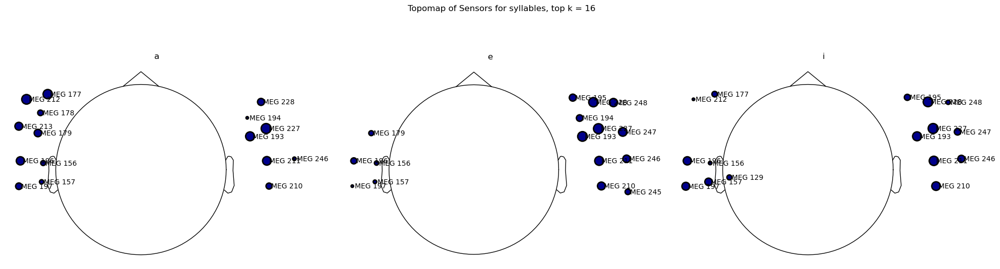

In [450]:

fig, ax = plt.subplots(1, 3, figsize=(20,20))

a_sample = copy.deepcopy(producing_full_crop)
a_info = a_sample[0].pick(a_top_names).info
mne.viz.plot_sensors(a_info, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[0])
del a_sample

e_sample = copy.deepcopy(producing_full_crop)
e_info = e_sample[0].pick(e_top_names).info
mne.viz.plot_sensors(e_info, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[1])
del e_sample

i_sample = copy.deepcopy(producing_full_crop)
i_info = i_sample[0].pick(i_top_names).info
mne.viz.plot_sensors(i_info, show=False, show_names=True, pointsize=np.arange(top_k * 200, 0, -200)/top_k, axes=ax[2])

fig.suptitle(f'Topomap of Sensors for syllables, top k = {top_k}', y=0.65)
ax[0].set_title("a")
ax[1].set_title("e")
ax[2].set_title("i")
plt.tight_layout()
plt.show()